In [1]:
import numpy as np
%matplotlib inline
from matplotlib import pyplot
from matplotlib.pyplot import plot

In [94]:
import pandas as pd
data=pd.read_csv('comparative_emotion_analyzer.csv')
data.head()

,Unnamed: 0,Song,Song_ID,Artists,Artists_Id,Popularity,Lengthofsing_ms,danceability,energy,loudness,...,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive
0,0,HIGHEST IN THE ROOM,3eekarcy7kvN4yt5ZFzltW,Travis Scott,0Y5tJX1MQlPlqiwlOH1tJY,98,175720,0.598,0.427,-8.764,...,0.040000,0.050000,0.040000,0.010000,0.035000,0.025000,0.025000,0.025000,0.045000,0.050000
1,1,Circles,21jGcNKet2qwijlDFuPiPb,Post Malone,246dkjvS1zLTtiykXe5h60,100,215280,0.695,0.762,-3.497,...,0.028846,0.025641,0.032051,0.025641,0.038462,0.019231,0.009615,0.025641,0.038462,0.032051
2,2,Bandit,6Gg1gjgKi2AK4e0qzsR7sd,Juice WRLD,4MCBfE4596Uoi2O4DtmEMz,94,189322,0.474,0.631,-5.884,...,0.061750,0.006861,0.008576,0.039451,0.006861,0.037736,0.005146,0.065180,0.082333,0.013722
3,3,Lose You To Love Me,1HfMVBKM75vxSfsQ5VefZ5,Selena Gomez,0C8ZW7ezQVs4URX5aX7Kqx,99,206458,0.505,0.340,-9.005,...,0.036415,0.002801,0.137255,0.030812,0.002801,0.044818,0.019608,0.033613,0.047619,0.145658
4,4,hot girl bummer,7aiClxsDWFRQ0Kzk5KI5ku,blackbear,2cFrymmkijnjDg9SS92EPM,97,185093,0.778,0.559,-7.109,...,0.033333,0.001961,0.007843,0.047059,0.000000,0.043137,0.000000,0.078431,0.086275,0.015686


In [97]:
#data=data.drop(['Unnamed: 0'],axis=1)
#data=data.drop(['Unnamed: 0','Artists_Id','source'],axis=1)
#data=data.drop(['Artists_Id','source','Album_type','Song_ID'],axis=1)
data.head()

,Song,Artists,Popularity,Lengthofsing_ms,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,...,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive
0,HIGHEST IN THE ROOM,Travis Scott,98,175720,0.598,0.427,-8.764,0,0.0546,0.0605,...,0.040000,0.050000,0.040000,0.010000,0.035000,0.025000,0.025000,0.025000,0.045000,0.050000
1,Circles,Post Malone,100,215280,0.695,0.762,-3.497,1,0.1920,0.5530,...,0.028846,0.025641,0.032051,0.025641,0.038462,0.019231,0.009615,0.025641,0.038462,0.032051
2,Bandit,Juice WRLD,94,189322,0.474,0.631,-5.884,0,0.0687,0.4250,...,0.061750,0.006861,0.008576,0.039451,0.006861,0.037736,0.005146,0.065180,0.082333,0.013722
3,Lose You To Love Me,Selena Gomez,99,206458,0.505,0.340,-9.005,1,0.5760,0.0916,...,0.036415,0.002801,0.137255,0.030812,0.002801,0.044818,0.019608,0.033613,0.047619,0.145658
4,hot girl bummer,blackbear,97,185093,0.778,0.559,-7.109,0,0.1280,0.6780,...,0.033333,0.001961,0.007843,0.047059,0.000000,0.043137,0.000000,0.078431,0.086275,0.015686


In [98]:
data['Lengthofsing_ms']=data['Lengthofsing_ms'].apply(lambda x:round(x/1000,3))
data.shape

(7100, 22)

In [99]:
data=data.rename(columns={'Lengthofsing_ms':'Lengthofsong_s'})

In [100]:
data.columns
data.head()
#data
#len(data['Artists'].unique())

,Song,Artists,Popularity,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,...,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive
0,HIGHEST IN THE ROOM,Travis Scott,98,175.720,0.598,0.427,-8.764,0,0.0546,0.0605,...,0.040000,0.050000,0.040000,0.010000,0.035000,0.025000,0.025000,0.025000,0.045000,0.050000
1,Circles,Post Malone,100,215.280,0.695,0.762,-3.497,1,0.1920,0.5530,...,0.028846,0.025641,0.032051,0.025641,0.038462,0.019231,0.009615,0.025641,0.038462,0.032051
2,Bandit,Juice WRLD,94,189.322,0.474,0.631,-5.884,0,0.0687,0.4250,...,0.061750,0.006861,0.008576,0.039451,0.006861,0.037736,0.005146,0.065180,0.082333,0.013722
3,Lose You To Love Me,Selena Gomez,99,206.458,0.505,0.340,-9.005,1,0.5760,0.0916,...,0.036415,0.002801,0.137255,0.030812,0.002801,0.044818,0.019608,0.033613,0.047619,0.145658
4,hot girl bummer,blackbear,97,185.093,0.778,0.559,-7.109,0,0.1280,0.6780,...,0.033333,0.001961,0.007843,0.047059,0.000000,0.043137,0.000000,0.078431,0.086275,0.015686


In [102]:
data.columns

Index(['Song', 'Artists', 'Popularity', 'Lengthofsong_s', 'danceability',
       'energy', 'loudness', 'Modemajor1_happier', 'acousticness', 'valence',
       'tempo', 'Release_date', 'Fear', 'Trust', 'Joy', 'Disgust',
       'Anticipation', 'Sadness', 'Suprise', 'Anger', 'Negative', 'Positive'],
      dtype='object')

In [105]:
dummy=data
dummy=dummy.drop(['Artists','Release_date'],axis=1)

#removing 'popularity', 'album type' too
#dummy=dummy.drop(['Popularity'],axis=1)
#dummy.head()
# dummy['Lengthofsong_s']=dummy['Lengthofsong_s'].apply(lambda x: round(x,2))
# #dummy=dummy.rename(columns={'Lengthofsing_ms':'Lengthofsong_s'})
# dummy.head()

In [106]:
dummy.head()

,Song,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive
0,HIGHEST IN THE ROOM,175.720,0.598,0.427,-8.764,0,0.0546,0.0605,76.469,0.040000,0.050000,0.040000,0.010000,0.035000,0.025000,0.025000,0.025000,0.045000,0.050000
1,Circles,215.280,0.695,0.762,-3.497,1,0.1920,0.5530,120.042,0.028846,0.025641,0.032051,0.025641,0.038462,0.019231,0.009615,0.025641,0.038462,0.032051
2,Bandit,189.322,0.474,0.631,-5.884,0,0.0687,0.4250,180.051,0.061750,0.006861,0.008576,0.039451,0.006861,0.037736,0.005146,0.065180,0.082333,0.013722
3,Lose You To Love Me,206.458,0.505,0.340,-9.005,1,0.5760,0.0916,101.993,0.036415,0.002801,0.137255,0.030812,0.002801,0.044818,0.019608,0.033613,0.047619,0.145658
4,hot girl bummer,185.093,0.778,0.559,-7.109,0,0.1280,0.6780,129.989,0.033333,0.001961,0.007843,0.047059,0.000000,0.043137,0.000000,0.078431,0.086275,0.015686


In [108]:
dummy.shape

(7100, 19)

In [135]:
d=dummy

In [ ]:
#Everything on d now

In [136]:
d['Mode']=d['Modemajor1_happier']

In [137]:
d=d.drop(['Modemajor1_happier'],axis=1)

In [138]:
d.head()
#d=d.drop_duplicates()
#d.shape
for i in range(2,18):
    d.iloc[:,i]=d.iloc[:,i].apply(lambda x: round(x,3))

In [140]:
d.head()

a=d.iloc[:,0:8]

In [141]:
a=a.drop(['Lengthofsong_s'],axis=1)

In [151]:

# a=a.drop_duplicates()
a.shape
a.head()
d.head()
d=d.drop(['Song'],axis=1)
x = StandardScaler().fit_transform(d)

In [235]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
from sklearn.cluster import KMeans
from sklearn import datasets
iris = datasets.load_iris()
d

,Lengthofsong_s,danceability,energy,loudness,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive,Mode
0,175.720,0.598,0.427,-8.764,0.055,0.060,76.469,0.040,0.050,0.040,0.010,0.035,0.025,0.025,0.025,0.045,0.050,0
1,215.280,0.695,0.762,-3.497,0.192,0.553,120.042,0.029,0.026,0.032,0.026,0.038,0.019,0.010,0.026,0.038,0.032,1
2,189.322,0.474,0.631,-5.884,0.069,0.425,180.051,0.062,0.007,0.009,0.039,0.007,0.038,0.005,0.065,0.082,0.014,0
3,206.458,0.505,0.340,-9.005,0.576,0.092,101.993,0.036,0.003,0.137,0.031,0.003,0.045,0.020,0.034,0.048,0.146,1
4,185.093,0.778,0.559,-7.109,0.128,0.678,129.989,0.033,0.002,0.008,0.047,0.000,0.043,0.000,0.078,0.086,0.016,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,173.640,0.900,0.649,-6.365,0.004,0.658,93.990,0.011,0.003,0.025,0.011,0.014,0.008,0.025,0.011,0.031,0.025,1
7096,155.714,0.425,0.504,-10.003,0.022,0.403,165.818,0.018,0.010,0.011,0.007,0.011,0.017,0.035,0.028,0.038,0.022,1
7097,198.403,0.397,0.249,-10.484,0.926,0.329,79.614,0.000,0.067,0.061,0.037,0.049,0.018,0.049,0.000,0.025,0.117,1
7098,198.586,0.746,0.682,-4.426,0.235,0.805,173.901,0.060,0.013,0.013,0.026,0.026,0.056,0.009,0.052,0.099,0.013,1


In [152]:
x

array([[-0.4894168 , -0.40250842, -1.10376549, ...,  0.13162971,
         0.29874392, -1.27390333],
       [ 0.27073654,  0.2287828 ,  0.77991094, ..., -0.0939486 ,
        -0.27005475,  0.78498892],
       [-0.22805164, -1.20951989,  0.04330911, ...,  1.32397222,
        -0.83885342, -1.27390333],
       ...,
       [-0.0535584 , -1.71064797, -2.10464431, ..., -0.51287975,
         2.41593898,  0.78498892],
       [-0.05004202,  0.5606988 ,  0.33007777, ...,  1.87180526,
        -0.87045335,  0.78498892],
       [ 1.21304997, -0.7539489 , -0.40652406, ...,  0.22830613,
         0.3935437 ,  0.78498892]])

In [164]:
distortions

[25684672.308476567,
 16402467.585319197,
 12668025.236070668,
 9841400.933714135,
 7632662.519161894,
 6403055.0052590715,
 5485212.637714843,
 4780107.530311912,
 4243741.856099828]

In [ ]:
x = StandardScaler().fit_transform(x)

In [181]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(d)
    distortions.append(kmeanModel.inertia_)

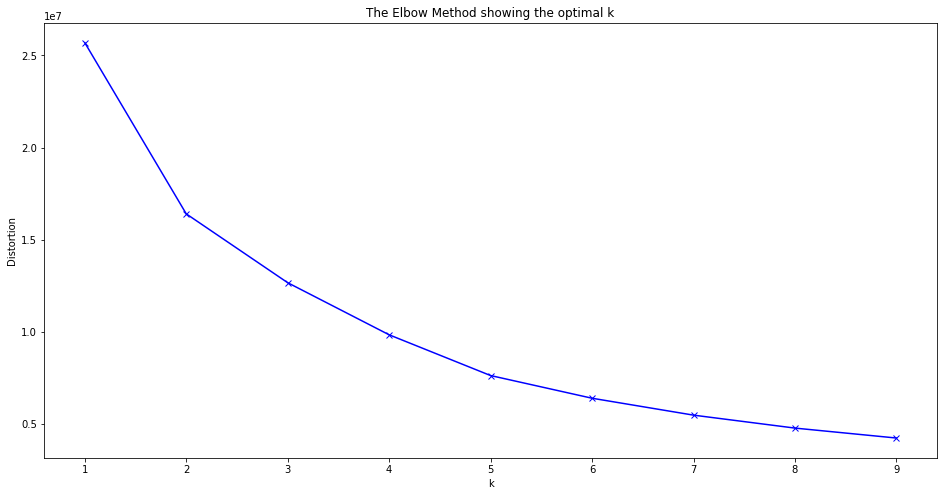

In [182]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [170]:
# Calculate silhouette_score
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
range_n_clusters = [2, 3, 4, 5, 6]


for n_clusters in range(1,10):
    # Create a subplot with 1 row and 2 columns
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    #fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    #ax1.set_xlim([-1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    #ax1.set_ylim([0, len(x) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(x)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(x, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(x, cluster_labels)

#     y_lower = 10
#     for i in range(n_clusters):
#         # Aggregate the silhouette scores for samples belonging to
#         # cluster i, and sort them
#         ith_cluster_silhouette_values = \
#             sample_silhouette_values[cluster_labels == i]

#         ith_cluster_silhouette_values.sort()

#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i

#         color = cm.nipy_spectral(float(i) / n_clusters)
#         ax1.fill_betweenx(np.arange(y_lower, y_upper),
#                           0, ith_cluster_silhouette_values,
#                           facecolor=color, edgecolor=color, alpha=0.7)

#         # Label the silhouette plots with their cluster numbers at the middle
#         ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

#         # Compute the new y_lower for next plot
#         y_lower = y_upper + 10  # 10 for the 0 samples

#     ax1.set_title("The silhouette plot for the various clusters.")
#     ax1.set_xlabel("The silhouette coefficient values")
#     ax1.set_ylabel("Cluster label")

#     # The vertical line for average silhouette score of all the values
#     ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

#     ax1.set_yticks([])  # Clear the yaxis labels / ticks
#     ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

#     # 2nd Plot showing the actual clusters formed
#     colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
#     ax2.scatter(x[:, 0], x[:, 1], marker='.', s=30, lw=0, alpha=0.7,
#                 c=colors, edgecolor='k')

#     # Labeling the clusters
#     centers = clusterer.cluster_centers_
#     # Draw white circles at cluster centers
#     ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
#                 c="white", alpha=1, s=200, edgecolor='k')

#     for i, c in enumerate(centers):
#         ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
#                     s=50, edgecolor='k')

#     ax2.set_title("The visualization of the clustered data.")
#     ax2.set_xlabel("Feature space for the 1st feature")
#     ax2.set_ylabel("Feature space for the 2nd feature")

#     plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
#                   "with n_clusters = %d" % n_clusters),
#                  fontsize=14, fontweight='bold')

# plt.show()


#print(silhouette_score(x, kmeans.labels_))

ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

For n_clusters = 2, silhouette score is 0.364090073261733)
For n_clusters = 3, silhouette score is 0.31369929821231995)
For n_clusters = 4, silhouette score is 0.3351841675814628)
For n_clusters = 5, silhouette score is 0.34984290347981484)
For n_clusters = 6, silhouette score is 0.33966144434612966)
For n_clusters = 7, silhouette score is 0.3294273051943912)
For n_clusters = 8, silhouette score is 0.3269541261139424)
For n_clusters = 9, silhouette score is 0.32943205170969847)
For n_clusters = 10, silhouette score is 0.3307980594915558)
For n_clusters = 11, silhouette score is 0.32711658616806655)
For n_clusters = 12, silhouette score is 0.32870216327646234)
For n_clusters = 13, silhouette score is 0.324583399117266)
For n_clusters = 14, silhouette score is 0.33311885490834625)
For n_clusters = 15, silhouette score is 0.32682590327815597)
For n_clusters = 16, silhouette score is 0.328139854255729)
For n_clusters = 17, silhouette score is 0.3338320266498529)
For n_clusters = 18, silhou

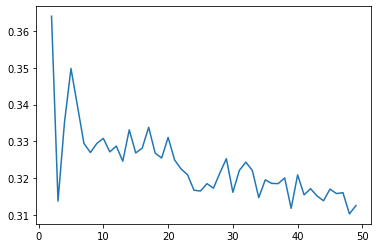

In [180]:
n_=[]
score_=[]
for n_clusters in range(2,50):

    n_.append(n_clusters)
    
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(d)
    centers = clusterer.cluster_centers_

    score = silhouette_score(d, preds, metric='euclidean')
    score_.append(score)
    print ("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))
    
plt.plot(n_,score_)



In [179]:
# plt.plot(n_,score_,'ro')
# plt.show()
n_

[39]

In [186]:
x[:,1]

array([-0.40250842,  0.2287828 , -1.20951989, ..., -1.71064797,
        0.5606988 , -0.7539489 ])

[-0.04813692  0.31007481 -0.0726681  -0.05034056]


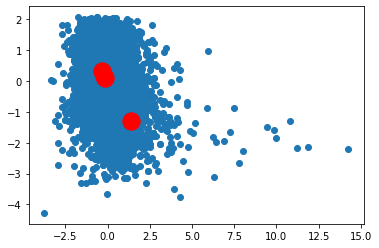

In [293]:
kmeans = KMeans(n_clusters=4, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(x)
plt.scatter(x[:,0], x[:,1])
print(kmeans.cluster_centers_[:, 0])
plt.scatter(kmeans.cluster_centers_[:, 4], kmeans.cluster_centers_[:, 2], s=300, c='red')
plt.show()

In [343]:
# df=pd.DataFrame(x)
# df.describe()
# d.head()
# a=d['energy'].sort_values
#a=d.sort_values(by='energy')
help(pd.plotting.parallel_coordinates)

Help on function parallel_coordinates in module pandas.plotting._misc:

parallel_coordinates(frame, class_column, cols=None, ax=None, color=None, use_columns=False, xticks=None, colormap=None, axvlines=True, axvlines_kwds=None, sort_labels=False, **kwds)
    Parallel coordinates plotting.
    
    Parameters
    ----------
    frame : DataFrame
    class_column : str
        Column name containing class names
    cols : list, optional
        A list of column names to use
    ax : matplotlib.axis, optional
        matplotlib axis object
    color : list or tuple, optional
        Colors to use for the different classes
    use_columns : bool, optional
        If true, columns will be used as xticks
    xticks : list or tuple, optional
        A list of values to use for xticks
    colormap : str or matplotlib colormap, default None
        Colormap to use for line colors.
    axvlines : bool, optional
        If true, vertical lines will be added at each xtick
    axvlines_kwds : keywo

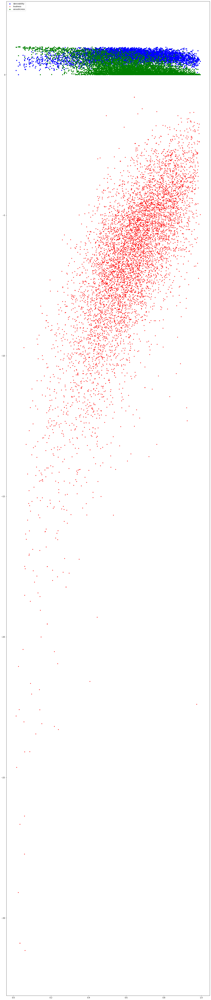

In [232]:
import matplotlib.pyplot as plt
#ENERRGY
a=d.sort_values(by='energy')
#x = range(100)
#y = range(100,200)
fig = plt.figure(figsize=(20, 100))
ax1 = fig.add_subplot(111)

ax1.scatter(a.iloc[:,2],a.iloc[:,1], s=10, c='b', marker="s", label='danceability')
ax1.scatter(a.iloc[:,2],a.iloc[:,3], s=10, c='r', marker="o", label='loudness')
ax1.scatter(a.iloc[:,2],a.iloc[:,4], s=10, c='g', marker="s", label='acousticness')

plt.legend(loc='upper left');
plt.show()

#Danceability and acousticness seem to be unaffected by 
#energy but Loudness is increasingly sharply as per the 
#scatter plot

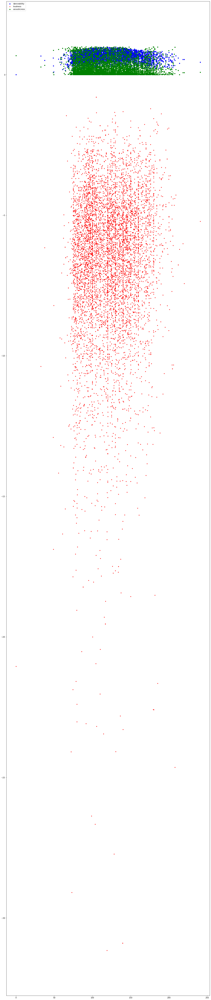

In [233]:
import matplotlib.pyplot as plt
#TEMPO
#x = range(100)
#y = range(100,200)
fig = plt.figure(figsize=(20, 100))
ax1 = fig.add_subplot(111)

ax1.scatter(a.iloc[:,6],a.iloc[:,1], s=10, c='b', marker="s", label='danceability')
ax1.scatter(a.iloc[:,6],a.iloc[:,3], s=10, c='r', marker="o", label='loudness')
ax1.scatter(a.iloc[:,6],a.iloc[:,4], s=10, c='g', marker="s", label='acousticness')

plt.legend(loc='upper left');
plt.show()

#Danceability and acousticness seem to be unaffected by 
#energy but Loudness is increasingly sharply as per the 
#scatter plot

In [245]:
import matplotlib.pyplot as plt
#VALENCE
a=d.sort_values(by='valence')
#x = range(100)
#y = range(100,200)
fig = plt.figure(figsize=(20, 900))
ax1 = fig.add_subplot(111)

ax1.scatter(a.iloc[:,5],a.iloc[:,1], s=10, c='b', marker="s", label='danceability')
ax1.scatter(a.iloc[:,5],a.iloc[:,3], s=10, c='r', marker="o", label='loudness')
ax1.scatter(a.iloc[:,5],a.iloc[:,4], s=10, c='g', marker="s", label='acousticness')

plt.legend(loc='upper left');
plt.show()

#Danceability and acousticness seem to be unaffected by 
#energy but Loudness is increasingly sharply as per the 
#scatter plot

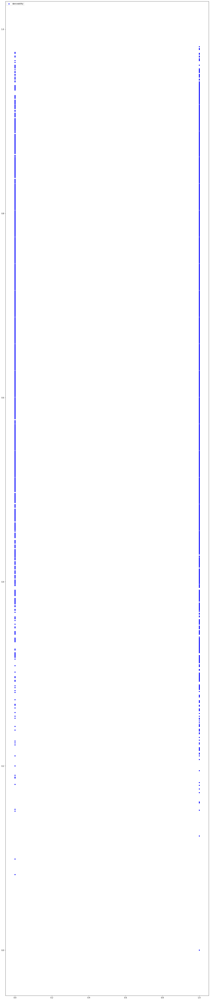

In [239]:
import matplotlib.pyplot as plt
#VALENCE
a=d.sort_values(by='Mode')
#x = range(100)
#y = range(100,200)
fig = plt.figure(figsize=(20, 100))
ax1 = fig.add_subplot(111)

ax1.scatter(a.iloc[:,-1],a.iloc[:,1], s=10, c='b', marker="s", label='danceability')
#ax1.scatter(a.iloc[:,-1],a.iloc[:,3], s=10, c='r', marker="o", label='loudness')
#ax1.scatter(a.iloc[:,-1],a.iloc[:,4], s=10, c='g', marker="s", label='acousticness')

plt.legend(loc='upper left');
plt.show()

#Danceability and acousticness seem to be unaffected by 
#energy but Loudness is increasingly sharply as per the 
#scatter plot

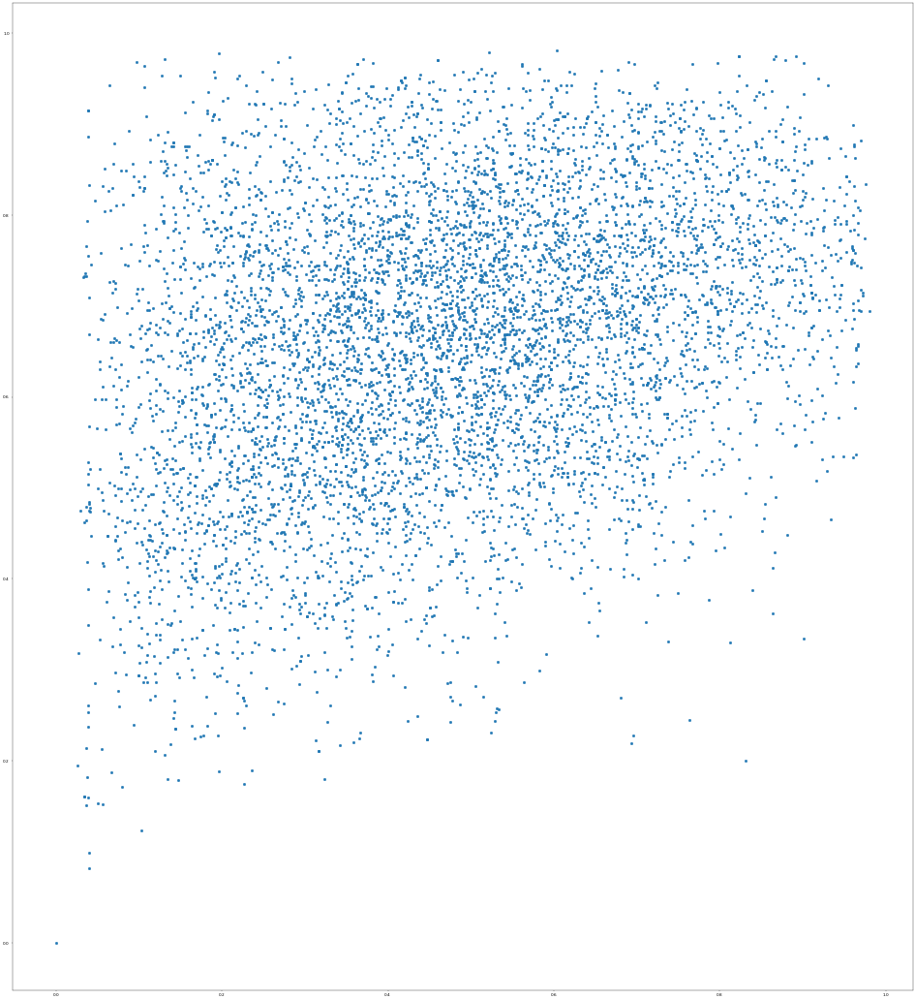

In [246]:
pyplot.figure(figsize=(40, 45), dpi=30)
pyplot.scatter(a['valence'],a['danceability'])

In [253]:
a_mode1=a[a['Mode']==1]
a_mode1
a_mode0=a[a['Mode']==0]
print(a_mode1.describe())
print(a_mode0.describe())

       Lengthofsong_s  danceability       energy     loudness  acousticness  \
count     4393.000000   4393.000000  4393.000000  4393.000000   4393.000000   
mean       202.598485      0.651313     0.616440    -6.764235      0.246402   
std         52.394929      0.157173     0.183521     2.846018      0.266366   
min          6.061000      0.000000     0.017000   -30.892000      0.000000   
25%        172.672000      0.544000     0.502000    -7.922000      0.033000   
50%        198.880000      0.664000     0.627000    -6.261000      0.141000   
75%        225.573000      0.768000     0.750000    -4.975000      0.385000   
max        943.528000      0.981000     0.988000     0.175000      0.995000   

           valence        tempo         Fear        Trust          Joy  \
count  4393.000000  4393.000000  4393.000000  4393.000000  4393.000000   
mean      0.463963   122.306337     0.023791     0.022506     0.025854   
std       0.218575    29.961373     0.022721     0.021991     0.02

Text(0.5, 1.0, 'Danceability in 2 modes')

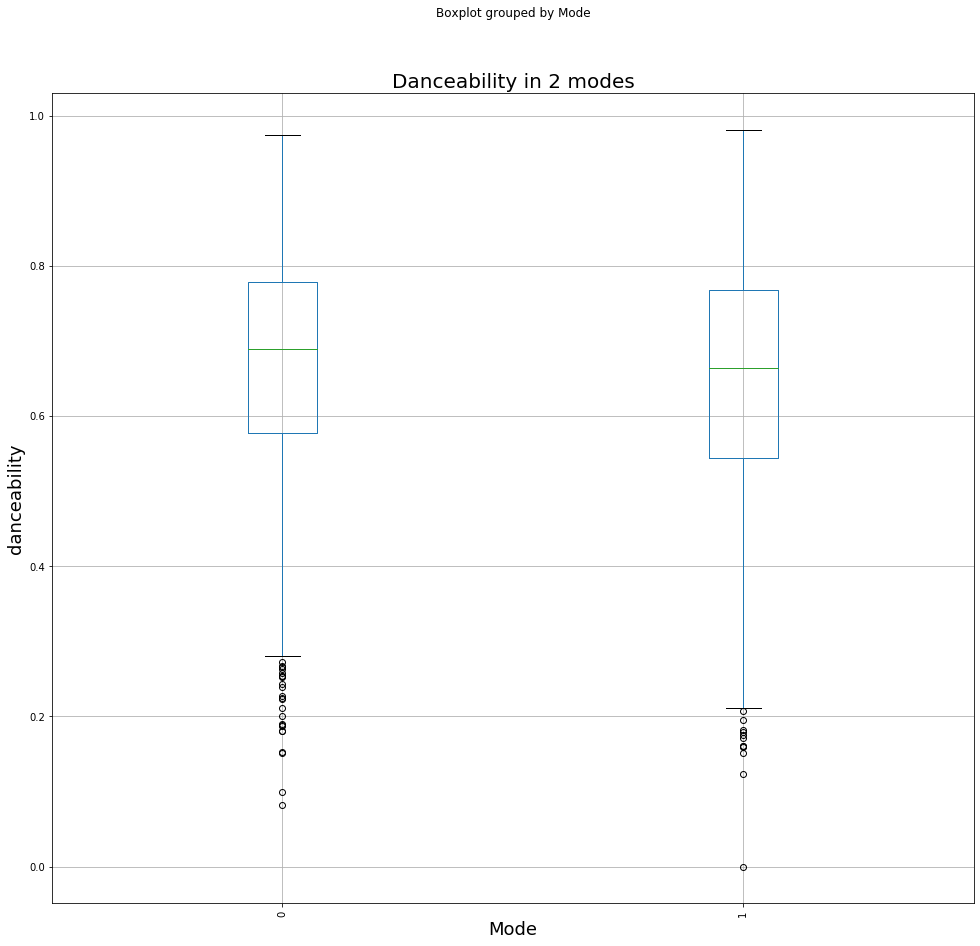

In [255]:
ax = a[['Mode', 'danceability']].boxplot(by='Mode', rot = 90,
                                         figsize=(16,15))


ax.yaxis.grid(True)
ax.set_xlabel('Mode', fontsize=18)
ax.set_ylabel('danceability', fontsize=18)
title = 'Danceability in 2 modes'
ax.set(ylabel='danceability')
ax.set_title(title, fontsize=20)

# ax.yaxis.grid(True)
# ax.set_xlabel('Year', fontsize=18)
# ax.set_ylabel(audio_feature, fontsize=18)
# title = audio_feature.title() + ' Over Time'
# ax.set(ylabel=audio_feature.title())
# ax.set_title(title, fontsize=20)

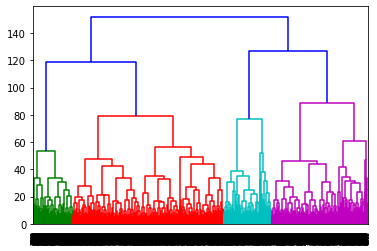

In [258]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(x, method='ward'))

In [266]:
#now we will see the aplit in 2 ways - decision tree and RF
#in 2 ways - binning valence or taking mode
# removing redundant variables - as they are highly likely to not produce good results

#to see the split and assess the values of those 3 vars on the 3 axes
#d.iloc[:,2:4].values
help(sch.dendrogram)

Help on function dendrogram in module scipy.cluster.hierarchy:

dendrogram(Z, p=30, truncate_mode=None, color_threshold=None, get_leaves=True, orientation='top', labels=None, count_sort=False, distance_sort=False, show_leaf_counts=True, no_plot=False, no_labels=False, leaf_font_size=None, leaf_rotation=None, leaf_label_func=None, show_contracted=False, link_color_func=None, ax=None, above_threshold_color='b')
    Plot the hierarchical clustering as a dendrogram.
    
    The dendrogram illustrates how each cluster is
    composed by drawing a U-shaped link between a non-singleton
    cluster and its children.  The top of the U-link indicates a
    cluster merge.  The two legs of the U-link indicate which clusters
    were merged.  The length of the two legs of the U-link represents
    the distance between the child clusters.  It is also the
    cophenetic distance between original observations in the two
    children clusters.
    
    Parameters
    ----------
    Z : ndarray
       

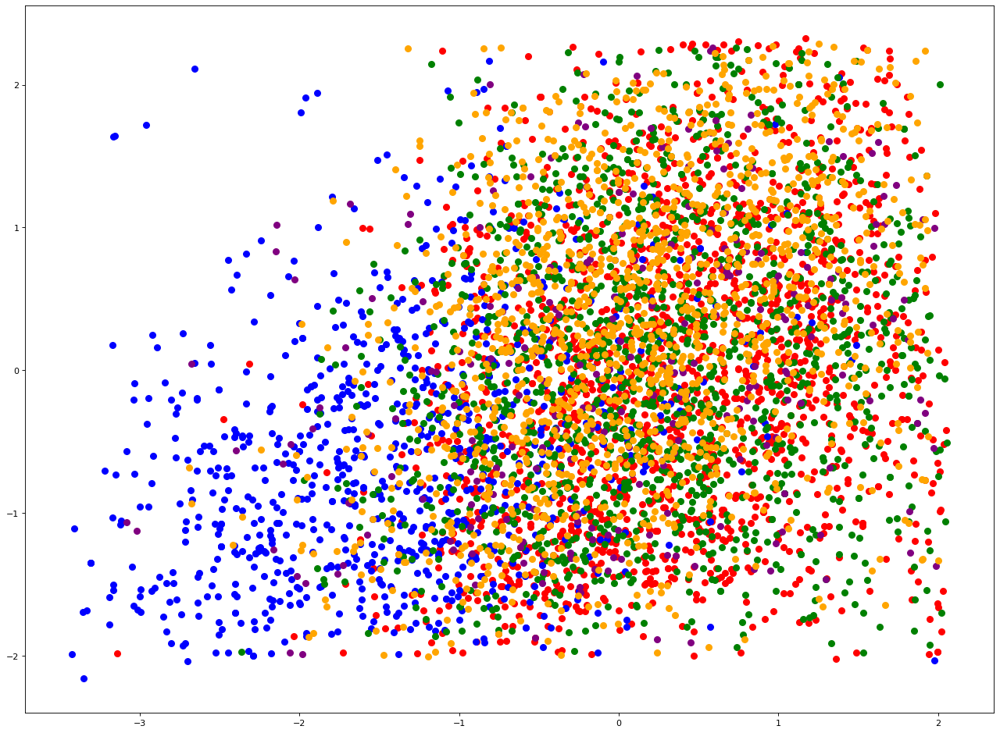

In [288]:
model = AgglomerativeClustering(n_clusters=8, affinity='euclidean', linkage='ward')
model.fit(x)
labels = model.labels_
plt.figure(figsize=(20, 15), dpi=80)
plt.scatter(x[labels==0, 2], x[labels==0, 5], s=50, marker='o', color='red')
plt.scatter(x[labels==1, 2], x[labels==1, 5], s=50, marker='o', color='blue')
plt.scatter(x[labels==2, 2], x[labels==2, 5], s=50, marker='o', color='green')
plt.scatter(x[labels==3, 2], x[labels==3, 5], s=50, marker='o', color='purple')
plt.scatter(x[labels==4, 2], x[labels==4, 5], s=50, marker='o', color='orange')
#fig= plt.figure(figsize=(20,30))
plt.show()

In [340]:
dummy.iloc[1:5,:].var()/dummy.var()

Lengthofsong_s        0.074785
danceability          0.916655
energy                0.985997
loudness              0.703755
Modemajor1_happier    1.412813
acousticness          0.807234
valence               1.331710
tempo                 1.239731
Fear                  0.422311
Trust                 0.259660
Joy                   5.581488
Disgust               0.269462
Anticipation          0.615452
Sadness               0.260186
Suprise               0.296571
Anger                 1.287908
Negative              0.606374
Positive              3.978974
Mode                  1.412813
dtype: float64

In [339]:
dummy.var()

Lengthofsong_s        2708.764996
danceability             0.023613
energy                   0.031633
loudness                 7.568739
Modemajor1_happier       0.235936
acousticness             0.064864
valence                  0.047804
tempo                  901.325745
Fear                     0.000517
Trust                    0.000474
Joy                      0.000679
Disgust                  0.000332
Anticipation             0.000517
Sadness                  0.000529
Suprise                  0.000234
Anger                    0.000491
Negative                 0.000963
Positive                 0.001001
Mode                     0.235936
dtype: float64

In [310]:
a=x[:,np.r_[2,5,6]]
len(a[:,0])
#energy,valence, tempo


7100

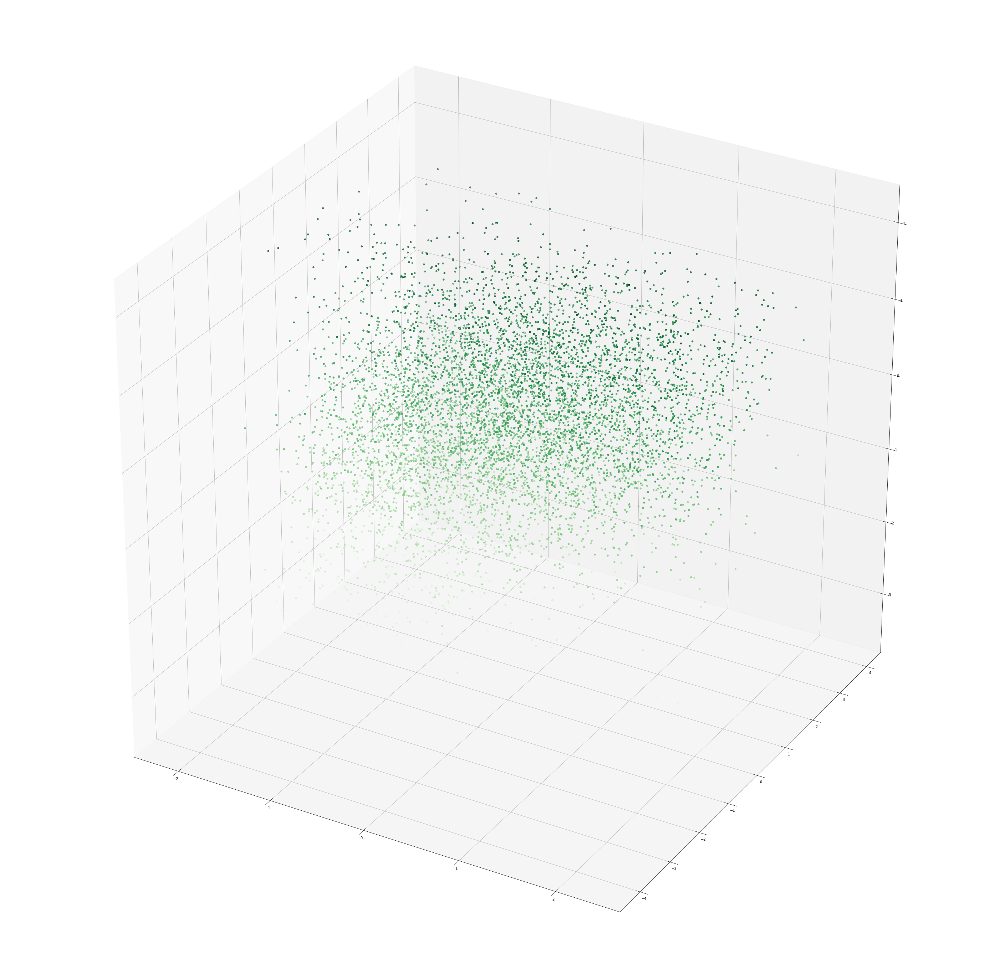

In [314]:
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(50,50))
ax = plt.axes(projection='3d')

zdata = a[:,0]
xdata = a[:,1]
ydata = a[:,2]
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens')

/Users/ishagupta/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  if __name__ == '__main__':


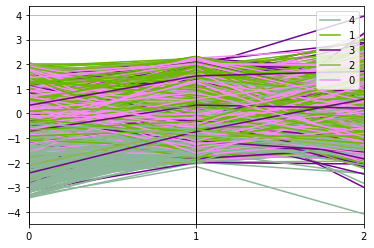

<Figure size 7200x4320 with 0 Axes>

In [383]:
#plot_feat = ['MalicAcid', 'Ash', 'OD280/OD315', 'Magnesium','TotalPhenols']

# Concat classes with the normalized data
data_norm = pd.concat([pd.DataFrame(x[:,np.r_[2,5,6]]),k], axis=1)

# Perform parallel coordinate plot
parallel_coordinates(data_norm, 'Class')
a=plt.figure(figsize=(100, 60))
a.show()

In [375]:
from pandas.plotting._misc import parallel_coordinates

In [346]:
clusterer = KMeans(n_clusters=5)
cluster_labels = clusterer.fit_predict(x)

In [384]:
k=pd.DataFrame(cluster_labels,columns=['Class'])
k

,Class
0,4
1,1
2,3
3,2
4,3
...,...
7095,0
7096,1
7097,2
7098,3


In [509]:
#Final Model
#dummy=dummy.drop(['Lengthofsong_s'],axis=1)
dum=dummy.iloc[1:100,:]
aa=dum[['energy','valence','tempo']]
dum=dum.drop(['Song'],axis=1)
x_.iloc[5:400,1:7]

,danceability,energy,loudness,acousticness,valence,tempo
5,0.677846,-1.705417,-0.191327,2.340529,0.472810,-1.046917
6,-1.033800,-1.227470,0.364847,2.002835,-0.117243,-0.418269
7,0.827533,0.504388,0.520066,-0.612331,1.328159,1.751953
8,-0.851571,1.555873,1.155849,-0.946099,-0.172132,1.926837
9,0.358946,0.003949,1.321974,-0.514164,-0.272761,1.187196
...,...,...,...,...,...,...
395,1.152941,0.942975,1.281624,0.043424,0.669494,-1.014905
396,-0.389492,0.420044,0.299051,-0.663378,0.449940,0.585763
397,-1.261585,0.431290,0.401925,0.239757,0.417921,-1.511008
398,-0.187739,0.515634,0.217988,-0.828298,-0.236169,0.445656


In [511]:
from sklearn.metrics.pairwise import cosine_similarity

#For the first comparison
#Taking both 'music + meaning + sentiments'

#cosim=cosine_similarity(x_.iloc[5:400,np.r_[2,5,6]],x_.iloc[5:400,np.r_[2,5,6]])
cosim2=cosine_similarity(x_.iloc[5:400,1:19],x_.iloc[5:400,1:19])
#cosim3=cosine_similarity(x_.iloc[5:400,1:7],x_.iloc[5:400,1:7])

#def firstchoice(top_n_songs_user_listen):
# j=1
# res=dict()
# min=1
# for i in range(len(cosim)):
#     #print('i',i)
#     for k in range(j):
#         #print('j',j)
#         if min>cosim[i][k]:
#             min=cosim[i][k]
#             res={str(i):min,str(j):min}
#             #print(res)
#     #print(i)
        
#     j+=1  
#     #print(j)
    
    
j=1
res2=dict()
min=1
for i in range(len(cosim2)):
    #print('i',i)
    for k in range(j):
        #print('j',j)
        if min>cosim2[i][k]:
            min=cosim2[i][k]
            res2={str(i):min,str(j):min}
            #print(res)
    #print(i)
        
    j+=1  
    #print(j)
    
    
# j=1
# res3=dict()
# min=1
# for i in range(len(cosim3)):
#     #print('i',i)
#     for k in range(j):
#         #print('j',j)
#         if min>cosim3[i][k]:
#             min=cosim3[i][k]
#             res3={str(i):min,str(j):min}
#             #print(res)
#     #print(i)
        
#     j+=1  
#     #print(j)
    

In [426]:
#cosim=cosine_similarity(aa,aa)
#cosim
cosim[0].min()

0.999975411215912

In [503]:
x_=pd.concat([dummy['Song'],pd.DataFrame(x[:,1:],columns=list(dummy.columns)[1:])],axis=1)
x_

,Song,danceability,energy,loudness,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive,Mode
0,HIGHEST IN THE ROOM,-0.402508,-1.103765,-0.756588,-0.730132,-1.882829,-1.531594,0.731787,1.287349,0.559918,-0.370755,0.537900,0.078251,0.822133,0.092615,0.131630,0.298744,-1.273903
1,Circles,0.228783,0.779911,1.158030,-0.192177,0.372181,-0.080127,0.247710,0.184545,0.253034,0.507741,0.669803,-0.182707,-0.158328,0.137726,-0.093949,-0.270055,0.784989
2,Bandit,-1.209520,0.043309,0.290327,-0.675158,-0.213299,1.918842,1.699942,-0.688508,-0.629259,1.221519,-0.693199,0.643660,-0.485149,1.897019,1.323972,-0.838853,-1.273903
3,Lose You To Love Me,-1.007767,-1.592959,-0.844194,1.315666,-1.736460,-0.681360,0.555759,-0.872309,4.280890,0.782271,-0.869070,0.948111,0.495312,0.498606,0.228306,3.332337,0.784989
4,hot girl bummer,0.768960,-0.361541,-0.154975,-0.443484,0.943938,0.251219,0.423738,-0.918259,-0.667619,1.660767,-1.000974,0.861125,-0.811969,2.483451,1.452874,-0.775654,-1.273903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,YUSO,1.562955,0.144522,0.115478,-0.930392,0.852457,-0.947949,-0.544417,-0.872309,-0.015490,-0.315849,-0.385424,-0.661131,0.822133,-0.538926,-0.319527,-0.491254,0.784989
7096,Sick Feeling,-1.528420,-0.670801,-1.206979,-0.859712,-0.313928,1.444724,-0.236367,-0.550658,-0.552538,-0.535473,-0.517328,-0.269694,1.475773,0.227946,-0.093949,-0.586054,0.784989
7097,For Now,-1.710648,-2.104644,-1.381829,2.690003,-0.652408,-1.426830,-1.028494,2.068502,1.365489,1.111707,1.153449,-0.226201,2.390870,-1.035137,-0.512880,2.415939,0.784989
7098,Supuestamente,0.560699,0.330078,0.820327,-0.023330,1.524843,1.713979,1.611928,-0.412807,-0.475817,0.507741,0.142189,1.426535,-0.223692,1.310588,1.871805,-0.870453,0.784989


In [488]:
x_.iloc[91:93,:]

,Song,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
91,bury a friend,-0.154630,1.595496,-1.317436,-2.843511,1.959641,-1.260758,-0.079994,0.291717,-0.045206,-0.092211,0.946989,0.318061,0.295716,-0.092964,0.182836,0.067179,-0.206855,0.784989
92,i love you,1.741007,-1.554452,-2.768148,-4.272113,2.792096,-1.608386,0.499620,0.423738,0.276445,0.214673,0.233211,0.449964,-0.095721,0.037764,0.543716,-0.093949,0.330344,0.784989


In [517]:
len(list(dummy.columns)[1:])
dummy.columns
x_

,Song,danceability,energy,loudness,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive,Mode
0,HIGHEST IN THE ROOM,-0.402508,-1.103765,-0.756588,-0.730132,-1.882829,-1.531594,0.731787,1.287349,0.559918,-0.370755,0.537900,0.078251,0.822133,0.092615,0.131630,0.298744,-1.273903
1,Circles,0.228783,0.779911,1.158030,-0.192177,0.372181,-0.080127,0.247710,0.184545,0.253034,0.507741,0.669803,-0.182707,-0.158328,0.137726,-0.093949,-0.270055,0.784989
2,Bandit,-1.209520,0.043309,0.290327,-0.675158,-0.213299,1.918842,1.699942,-0.688508,-0.629259,1.221519,-0.693199,0.643660,-0.485149,1.897019,1.323972,-0.838853,-1.273903
3,Lose You To Love Me,-1.007767,-1.592959,-0.844194,1.315666,-1.736460,-0.681360,0.555759,-0.872309,4.280890,0.782271,-0.869070,0.948111,0.495312,0.498606,0.228306,3.332337,0.784989
4,hot girl bummer,0.768960,-0.361541,-0.154975,-0.443484,0.943938,0.251219,0.423738,-0.918259,-0.667619,1.660767,-1.000974,0.861125,-0.811969,2.483451,1.452874,-0.775654,-1.273903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,YUSO,1.562955,0.144522,0.115478,-0.930392,0.852457,-0.947949,-0.544417,-0.872309,-0.015490,-0.315849,-0.385424,-0.661131,0.822133,-0.538926,-0.319527,-0.491254,0.784989
7096,Sick Feeling,-1.528420,-0.670801,-1.206979,-0.859712,-0.313928,1.444724,-0.236367,-0.550658,-0.552538,-0.535473,-0.517328,-0.269694,1.475773,0.227946,-0.093949,-0.586054,0.784989
7097,For Now,-1.710648,-2.104644,-1.381829,2.690003,-0.652408,-1.426830,-1.028494,2.068502,1.365489,1.111707,1.153449,-0.226201,2.390870,-1.035137,-0.512880,2.415939,0.784989
7098,Supuestamente,0.560699,0.330078,0.820327,-0.023330,1.524843,1.713979,1.611928,-0.412807,-0.475817,0.507741,0.142189,1.426535,-0.223692,1.310588,1.871805,-0.870453,0.784989


In [512]:
print(res,res2,res3)


{'361': -0.9999982927683628, '362': -0.9999982927683628} {'283': -0.878890948074844, '284': -0.878890948074844} {'391': -0.996127009300148, '392': -0.996127009300148}


In [533]:
for i in [361,362,283,284,391,392]:
    print(x_.iloc[i][0])

The Search
Cover Me Up
Focus 
ilomilo
Two Face
Bleed It


In [532]:
for i in range(2):
    print(list(res2.keys())[i])
    a=x_.iloc[int(list(res2.keys())[i])][0]
    print(a)

283
Focus 
284
ilomilo


In [535]:
cosim2.shape


(395, 395)

In [536]:
x_

,Song,danceability,energy,loudness,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Anger,Negative,Positive,Mode
0,HIGHEST IN THE ROOM,-0.402508,-1.103765,-0.756588,-0.730132,-1.882829,-1.531594,0.731787,1.287349,0.559918,-0.370755,0.537900,0.078251,0.822133,0.092615,0.131630,0.298744,-1.273903
1,Circles,0.228783,0.779911,1.158030,-0.192177,0.372181,-0.080127,0.247710,0.184545,0.253034,0.507741,0.669803,-0.182707,-0.158328,0.137726,-0.093949,-0.270055,0.784989
2,Bandit,-1.209520,0.043309,0.290327,-0.675158,-0.213299,1.918842,1.699942,-0.688508,-0.629259,1.221519,-0.693199,0.643660,-0.485149,1.897019,1.323972,-0.838853,-1.273903
3,Lose You To Love Me,-1.007767,-1.592959,-0.844194,1.315666,-1.736460,-0.681360,0.555759,-0.872309,4.280890,0.782271,-0.869070,0.948111,0.495312,0.498606,0.228306,3.332337,0.784989
4,hot girl bummer,0.768960,-0.361541,-0.154975,-0.443484,0.943938,0.251219,0.423738,-0.918259,-0.667619,1.660767,-1.000974,0.861125,-0.811969,2.483451,1.452874,-0.775654,-1.273903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,YUSO,1.562955,0.144522,0.115478,-0.930392,0.852457,-0.947949,-0.544417,-0.872309,-0.015490,-0.315849,-0.385424,-0.661131,0.822133,-0.538926,-0.319527,-0.491254,0.784989
7096,Sick Feeling,-1.528420,-0.670801,-1.206979,-0.859712,-0.313928,1.444724,-0.236367,-0.550658,-0.552538,-0.535473,-0.517328,-0.269694,1.475773,0.227946,-0.093949,-0.586054,0.784989
7097,For Now,-1.710648,-2.104644,-1.381829,2.690003,-0.652408,-1.426830,-1.028494,2.068502,1.365489,1.111707,1.153449,-0.226201,2.390870,-1.035137,-0.512880,2.415939,0.784989
7098,Supuestamente,0.560699,0.330078,0.820327,-0.023330,1.524843,1.713979,1.611928,-0.412807,-0.475817,0.507741,0.142189,1.426535,-0.223692,1.310588,1.871805,-0.870453,0.784989


/Users/ishagupta/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  


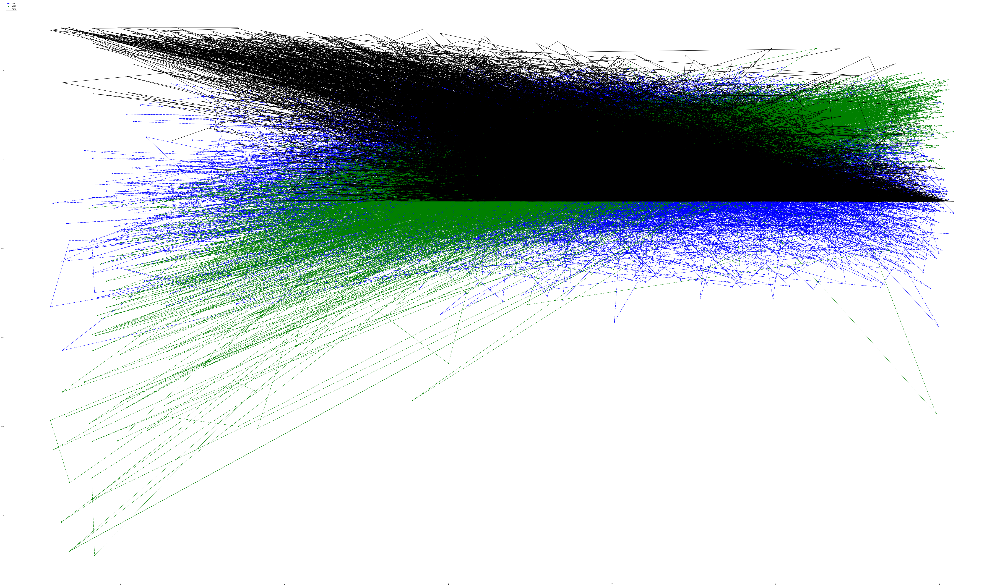

In [209]:

fig=plt.figure(figsize=(100, 60))
fig.show()
ax=fig.add_subplot(111)

ax.plot(df.iloc[:,2],df.iloc[:,1],c='b',marker="^",ls='--',label='GNE',fillstyle='none')
ax.plot(df.iloc[:,2],df.iloc[:,3],c='g',marker=(8,2,0),ls='--',label='MMR')
ax.plot(df.iloc[:,2],df.iloc[:,4],c='k',ls='-',label='Rand')
#ax.plot(x,(x-1)**2,c='r',marker="v",ls='-',label='GMC')
#ax.plot(x,x**2-1,c='m',marker="o",ls='--',label='BSwap',fillstyle='none')
#ax.plot(x,x-1,c='k',marker="+",ls=':',label='MSD')

plt.legend(loc=2)
plt.draw()

In [28]:
for i in range(6,17):
    dummy.iloc[:,i]=dummy.iloc[:,i].apply(lambda x: round(x,3))


In [32]:
#data['Album_type'].unique()
dummy.head()
#dummy.iloc[:,17]=dummy.iloc[:,17].apply(lambda x: round(x,3))

,Song,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,HIGHEST IN THE ROOM,175.72,0.598,0.427,-8.764,0,0.055,0.060,76.469,0.040,0.050,0.040,0.010,0.035,0.025,0.025,0.045,0.050
1,Circles,215.28,0.695,0.762,-3.497,1,0.192,0.553,120.042,0.029,0.026,0.032,0.026,0.038,0.019,0.010,0.038,0.032
2,Bandit,189.32,0.474,0.631,-5.884,0,0.069,0.425,180.051,0.062,0.007,0.009,0.039,0.007,0.038,0.005,0.082,0.014
3,Lose You To Love Me,206.46,0.505,0.340,-9.005,1,0.576,0.092,101.993,0.036,0.003,0.137,0.031,0.003,0.045,0.020,0.048,0.146
4,hot girl bummer,185.09,0.778,0.559,-7.109,0,0.128,0.678,129.989,0.033,0.002,0.008,0.047,0.000,0.043,0.000,0.086,0.016


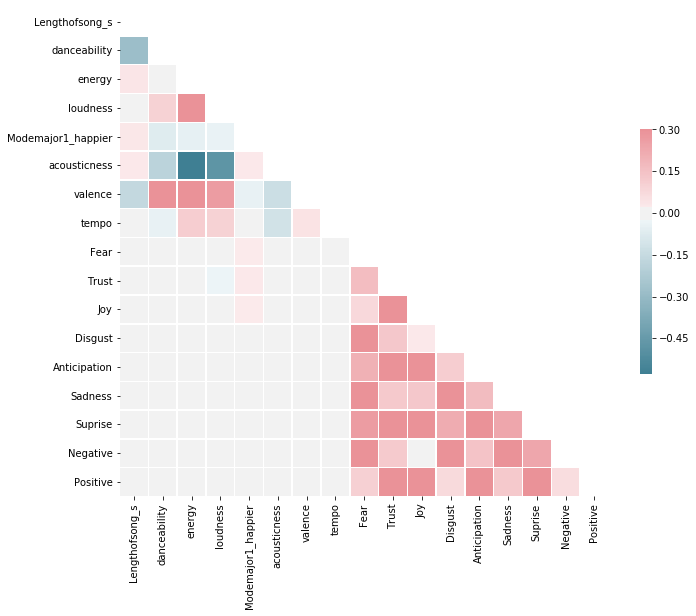

In [77]:
corr = dummy.corr()
import seaborn as sns
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = pyplot.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [78]:
corr

,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
Lengthofsong_s,1.000000,-0.283330,0.037144,0.008898,0.034470,0.030512,-0.160388,-0.015553,0.000221,-0.005304,-0.009900,0.002789,-0.019570,-0.002203,-0.014779,-0.005189,-0.008779
danceability,-0.283330,1.000000,-0.000041,0.100617,-0.070753,-0.181051,0.313312,-0.045991,0.020253,-0.000563,-0.002639,0.008066,0.001264,0.009382,0.002781,0.008724,0.001013
energy,0.037144,-0.000041,1.000000,0.729931,-0.049125,-0.578764,0.324124,0.115547,-0.011041,-0.011410,-0.006001,-0.022574,0.001045,-0.002801,-0.007036,-0.020874,-0.006023
loudness,0.008898,0.100617,0.729931,1.000000,-0.037770,-0.478081,0.265932,0.099772,-0.002862,-0.030076,-0.016578,-0.010450,-0.017387,0.006642,-0.001365,-0.017867,-0.018748
Modemajor1_happier,0.034470,-0.070753,-0.049125,-0.037770,1.000000,0.027313,-0.044690,-0.005986,0.023553,0.030569,0.022015,0.002310,0.019644,0.010931,0.017249,0.019445,0.018732
acousticness,0.030512,-0.181051,-0.578764,-0.478081,0.027313,1.000000,-0.134474,-0.117052,-0.006095,0.011151,0.013405,-0.003725,-0.000430,-0.006346,-0.002539,-0.000675,0.006533
valence,-0.160388,0.313312,0.324124,0.265932,-0.044690,-0.134474,1.000000,0.049193,-0.009111,-0.002444,-0.012308,-0.005855,-0.002164,-0.002998,-0.012532,-0.007902,-0.012112
tempo,-0.015553,-0.045991,0.115547,0.099772,-0.005986,-0.117052,0.049193,1.000000,-0.012549,0.005422,0.017675,-0.004387,0.003922,-0.011055,0.008045,-0.012336,0.014597
Fear,0.000221,0.020253,-0.011041,-0.002862,0.023553,-0.006095,-0.009111,-0.012549,1.000000,0.164575,0.078438,0.602086,0.200868,0.673895,0.269066,0.679685,0.104967
Trust,-0.005304,-0.000563,-0.011410,-0.030076,0.030569,0.011151,-0.002444,0.005422,0.164575,1.000000,0.581415,0.133393,0.501818,0.127389,0.404362,0.124597,0.657998


In [11]:
data.describe()

,Popularity,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
count,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000,7100.000000
mean,62.738028,201.190294,0.659847,0.623298,-6.682672,0.618732,0.240941,0.471632,122.447411,0.023374,0.021977,0.025404,0.016760,0.022765,0.023207,0.012419,0.040915,0.040551
std,13.996170,52.045797,0.153664,0.177857,2.751134,0.485732,0.254686,0.218640,30.022088,0.022733,0.021767,0.026067,0.018213,0.022746,0.022994,0.015293,0.031037,0.031645
min,0.000000,6.061000,0.000000,0.013700,-31.153000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,58.000000,171.840000,0.554000,0.511000,-7.876500,0.000000,0.037000,0.302000,97.485750,0.007720,0.007937,0.008889,0.003949,0.008753,0.008065,0.002948,0.019795,0.020555
50%,64.000000,197.533000,0.673000,0.632000,-6.231000,1.000000,0.146000,0.464000,120.301000,0.018544,0.017483,0.019169,0.012170,0.018072,0.018300,0.008929,0.037037,0.035264
75%,70.000000,224.007000,0.773000,0.752000,-4.923750,1.000000,0.371000,0.633000,144.048250,0.032411,0.029600,0.033557,0.023682,0.030769,0.031373,0.016753,0.055820,0.053199
max,100.000000,943.528000,0.981000,0.994000,0.175000,1.000000,0.995000,0.980000,241.005000,0.363380,0.255682,0.535714,0.283019,0.500000,0.333333,0.283019,0.504644,0.535714


In [160]:
a=data
a=a.drop(['Release_date'],axis=1)

In [33]:
a=dummy
a=a.drop_duplicates()
a.shape #dropped duplicates form the copy of major dataset named as a

(7099, 18)

In [34]:
a.isnull().mean() #Hence no null values
a.isnull().mean(axis=1)!=0


0       False
1       False
2       False
3       False
4       False
        ...  
7095    False
7096    False
7097    False
7098    False
7099    False
Length: 7099, dtype: bool

In [35]:
import seaborn as sns


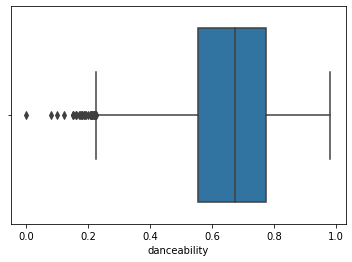

In [36]:
sns.boxplot(x=a['danceability'])

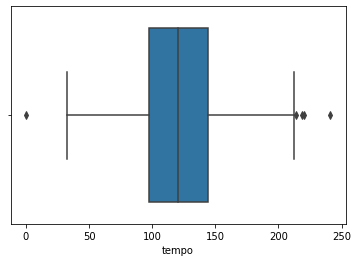

In [37]:
sns.boxplot(x=a['tempo'])

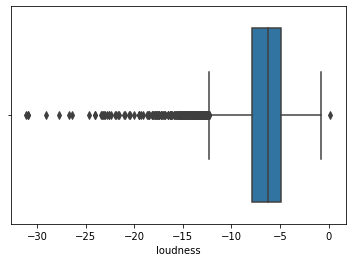

In [38]:
sns.boxplot(x=a['loudness'])

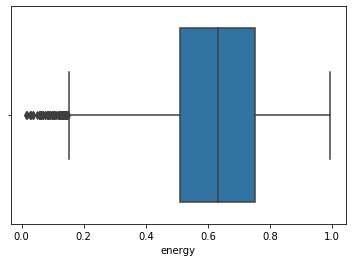

In [39]:
sns.boxplot(x=a['energy'])

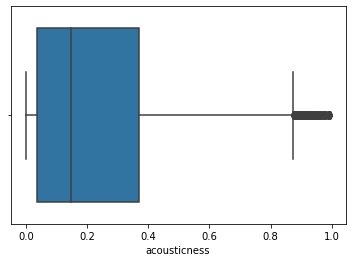

In [40]:
sns.boxplot(x=a['acousticness'])

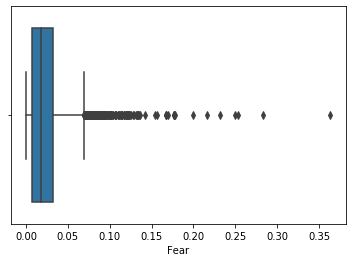

In [41]:
sns.boxplot(x=a['Fear'])

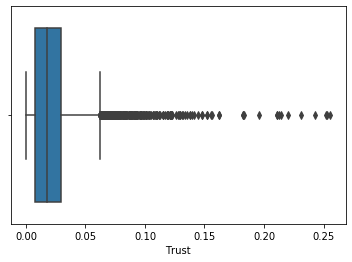

In [42]:
sns.boxplot(x=a['Trust'])

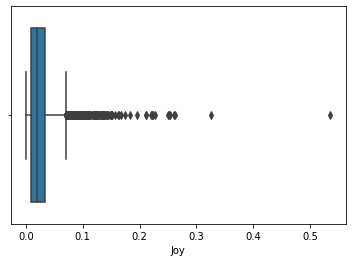

In [43]:
sns.boxplot(x=a['Joy'])

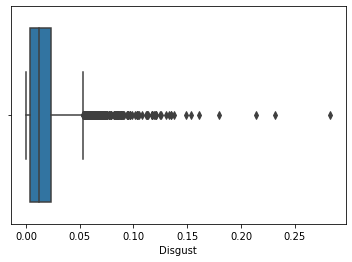

In [44]:
sns.boxplot(x=a['Disgust'])

In [36]:
a.columns

Index(['Song', 'Lengthofsong_s', 'danceability', 'energy', 'loudness',
       'Modemajor1_happier', 'acousticness', 'valence', 'tempo', 'Fear',
       'Trust', 'Joy', 'Disgust', 'Anticipation', 'Sadness', 'Suprise',
       'Negative', 'Positive'],
      dtype='object')

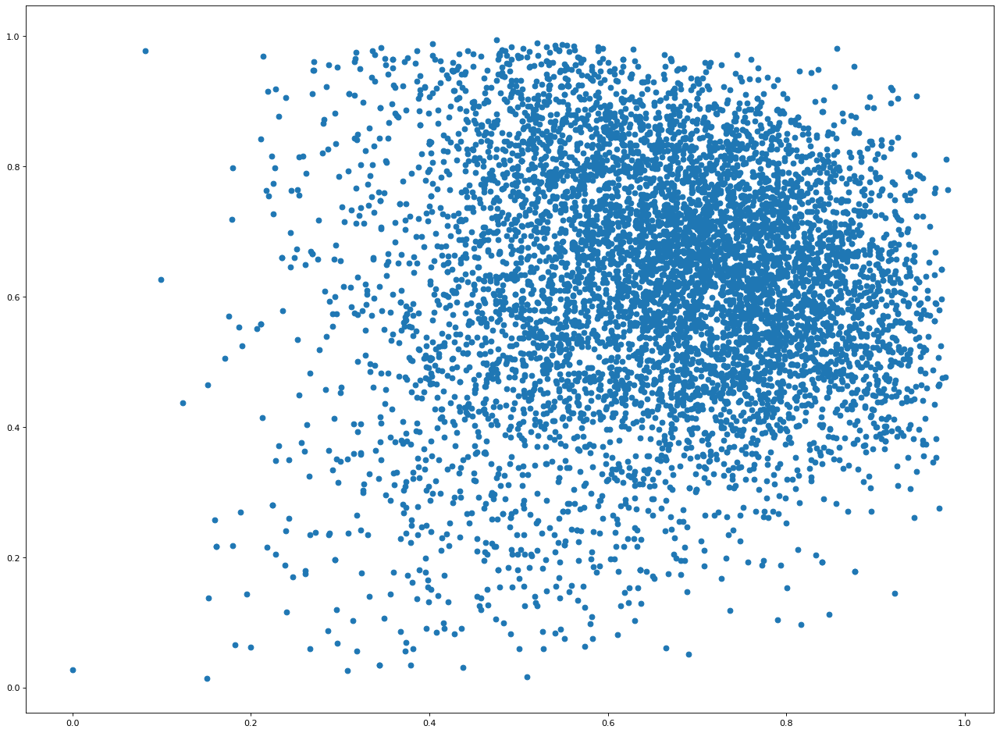

In [55]:
pyplot.figure(figsize=(20, 15), dpi=80)
pyplot.scatter(a['danceability'],a['energy'])

# Performing PCA
> standard scaler - normalize


In [40]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%matplotlib inline
import mlxtend
from mlxtend.plotting import plot_pca_correlation_graph

In [117]:
!pip install mlxtend

     |████████████████████████████████| 1.3MB 2.6MB/s eta 0:00:01


In [39]:
a

,Song,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,HIGHEST IN THE ROOM,175.72,0.598,0.427,-8.764,0,0.055,0.060,76.469,0.040,0.050,0.040,0.010,0.035,0.025,0.025,0.045,0.050
1,Circles,215.28,0.695,0.762,-3.497,1,0.192,0.553,120.042,0.029,0.026,0.032,0.026,0.038,0.019,0.010,0.038,0.032
2,Bandit,189.32,0.474,0.631,-5.884,0,0.069,0.425,180.051,0.062,0.007,0.009,0.039,0.007,0.038,0.005,0.082,0.014
3,Lose You To Love Me,206.46,0.505,0.340,-9.005,1,0.576,0.092,101.993,0.036,0.003,0.137,0.031,0.003,0.045,0.020,0.048,0.146
4,hot girl bummer,185.09,0.778,0.559,-7.109,0,0.128,0.678,129.989,0.033,0.002,0.008,0.047,0.000,0.043,0.000,0.086,0.016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,YUSO,173.64,0.900,0.649,-6.365,1,0.004,0.658,93.990,0.011,0.003,0.025,0.011,0.014,0.008,0.025,0.031,0.025
7096,Sick Feeling,155.71,0.425,0.504,-10.003,1,0.022,0.403,165.818,0.018,0.010,0.011,0.007,0.011,0.017,0.035,0.038,0.022
7097,For Now,198.40,0.397,0.249,-10.484,1,0.926,0.329,79.614,0.000,0.067,0.061,0.037,0.049,0.018,0.049,0.025,0.117
7098,Supuestamente,198.59,0.746,0.682,-4.426,1,0.235,0.805,173.901,0.060,0.013,0.013,0.026,0.026,0.056,0.009,0.099,0.013


In [ ]:
#to normalize removing non-numerric data


In [45]:
a_=a.iloc[:,2:]
a_.head()

,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,0.598,0.427,-8.764,0,0.055,0.060,76.469,0.040,0.050,0.040,0.010,0.035,0.025,0.025,0.045,0.050
1,0.695,0.762,-3.497,1,0.192,0.553,120.042,0.029,0.026,0.032,0.026,0.038,0.019,0.010,0.038,0.032
2,0.474,0.631,-5.884,0,0.069,0.425,180.051,0.062,0.007,0.009,0.039,0.007,0.038,0.005,0.082,0.014
3,0.505,0.340,-9.005,1,0.576,0.092,101.993,0.036,0.003,0.137,0.031,0.003,0.045,0.020,0.048,0.146
4,0.778,0.559,-7.109,0,0.128,0.678,129.989,0.033,0.002,0.008,0.047,0.000,0.043,0.000,0.086,0.016


In [61]:
features=list(a.columns)[2:]
#features
a.iloc[:,2:].head()
features

['danceability',
 'energy',
 'loudness',
 'Modemajor1_happier',
 'acousticness',
 'valence',
 'tempo',
 'Fear',
 'Trust',
 'Joy',
 'Disgust',
 'Anticipation',
 'Sadness',
 'Suprise',
 'Negative',
 'Positive']

In [46]:
#a_=a.drop(['Song','Artists','Modemajor1_happier'],axis=1)

k=list(a_)
x=a_.loc[:,k].values
y=a.loc[:,['Modemajor1_happier']].values
x = StandardScaler().fit_transform(x)

In [48]:
y=a.loc[:,'Modemajor1_happier'].values
#a


In [150]:
#x = StandardScaler().fit_transform(x)
x.var()

1.0

In [51]:
a_.var()

danceability            0.023613
energy                  0.031637
loudness                7.569649
Modemajor1_happier      0.235915
acousticness            0.064873
valence                 0.047801
tempo                 901.375129
Fear                    0.000516
Trust                   0.000474
Joy                     0.000680
Disgust                 0.000332
Anticipation            0.000517
Sadness                 0.000529
Suprise                 0.000234
Negative                0.000963
Positive                0.001001
dtype: float64

In [52]:
pd.DataFrame(data = x, columns = features).head()

,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,-0.402638,-1.103701,-0.756488,-1.274139,-0.730041,-1.882707,-1.531662,0.731645,1.287209,0.559779,-0.370880,0.537759,0.078109,0.821998,0.131451,0.298577
1,0.228648,0.779841,1.158014,0.784844,-0.192121,0.372347,-0.080235,0.247566,0.184403,0.252896,0.507606,0.669662,-0.182850,-0.158439,-0.094139,-0.270247
2,-1.209643,0.043292,0.290363,-1.274139,-0.675071,-0.213143,1.918679,1.699804,-0.688652,-0.629394,1.221376,-0.693340,0.643519,-0.485251,1.323855,-0.839072
3,-1.007892,-1.592859,-0.844090,0.784844,1.315627,-1.736335,-0.681452,0.555617,-0.872452,4.280738,0.782133,-0.869211,0.947970,0.495186,0.228132,3.332307
4,0.768821,-0.361529,-0.154912,-1.274139,-0.443412,0.944116,0.251102,0.423595,-0.918403,-0.667754,1.660619,-1.001115,0.860984,-0.812064,1.452764,-0.775869


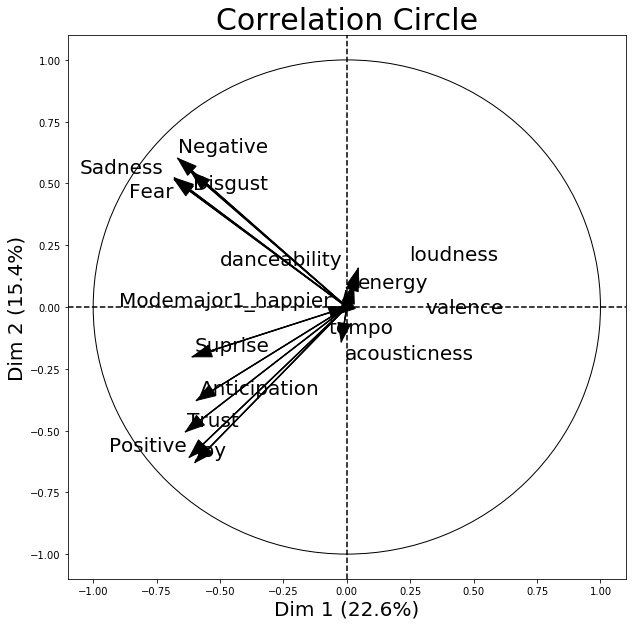

In [63]:
figure, correlation_matrix = plot_pca_correlation_graph(x, 
                                                        features,
                                                        dimensions=(1,2,3),
                                                        #x_pca=features[1],
                                                        figure_axis_size=10)

In [120]:
help(plot_pca_correlation_graph)

Help on function plot_pca_correlation_graph in module mlxtend.plotting.pca_correlation_graph:

plot_pca_correlation_graph(X, variables_names, dimensions=(1, 2), figure_axis_size=6, X_pca=None)
    Compute the PCA for X and plots the Correlation graph
    
    Parameters
    ----------
    X : 2d array like.
        The columns represent the different variables and the rows are the
         samples of thos variables
    variables_names : array like
        Name of the columns (the variables) of X
    dimensions: tuple with two elements.
        dimensions to be plot (x,y)
    X_pca : optional. if not provided, compute PCA independently
    figure_axis_size :
         size of the final frame. The figure created is a square with length
         and width equal to figure_axis_size.
    Returns
    ----------
        matplotlib_figure , correlation_matrix



In [123]:
figure.savefig('correlationcircle.jpeg')

In [66]:
correlation_matrix

,Dim 1,Dim 2,Dim 3
danceability,-0.004414,0.065533,-0.259015
energy,0.042802,0.141064,-0.865806
loudness,0.044887,0.156467,-0.824012
Modemajor1_happier,-0.041382,-0.031169,0.091557
acousticness,-0.021800,-0.140443,0.733656
valence,0.027055,0.090374,-0.492554
tempo,0.004223,0.001419,-0.206137
Fear,-0.679637,0.515193,0.065739
Trust,-0.635751,-0.504924,-0.098434
Joy,-0.598300,-0.628764,-0.125823


In [80]:
#correlation_matrix.var()
correlation_matrix.iloc[1,:]
dummy.head()

,Song,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,HIGHEST IN THE ROOM,175.72,0.598,0.427,-8.764,0,0.055,0.060,76.469,0.040,0.050,0.040,0.010,0.035,0.025,0.025,0.045,0.050
1,Circles,215.28,0.695,0.762,-3.497,1,0.192,0.553,120.042,0.029,0.026,0.032,0.026,0.038,0.019,0.010,0.038,0.032
2,Bandit,189.32,0.474,0.631,-5.884,0,0.069,0.425,180.051,0.062,0.007,0.009,0.039,0.007,0.038,0.005,0.082,0.014
3,Lose You To Love Me,206.46,0.505,0.340,-9.005,1,0.576,0.092,101.993,0.036,0.003,0.137,0.031,0.003,0.045,0.020,0.048,0.146
4,hot girl bummer,185.09,0.778,0.559,-7.109,0,0.128,0.678,129.989,0.033,0.002,0.008,0.047,0.000,0.043,0.000,0.086,0.016


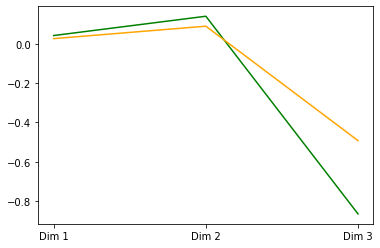

In [79]:
import matplotlib.pyplot as plt
plt.plot(correlation_matrix.columns, correlation_matrix.iloc[1,:], color='g')
plt.plot(correlation_matrix.columns, correlation_matrix.iloc[5,:], color='orange')
# plt.xlabel('Countries')
# plt.ylabel('Population in million')
# plt.title('Pakistan India Population till 2010')
plt.show()

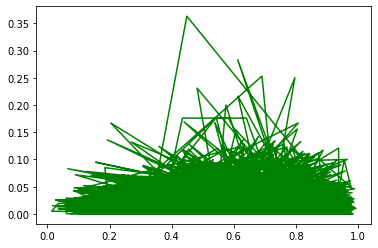

In [89]:
import matplotlib.pyplot as plt
plt.plot(dummy['energy'], dummy['Fear'], color='g')
#plt.plot(correlation_matrix.columns, correlation_matrix.iloc[5,:], color='orange')
# plt.xlabel('Countries')
# plt.ylabel('Population in million')
# plt.title('Pakistan India Population till 2010')
plt.show()

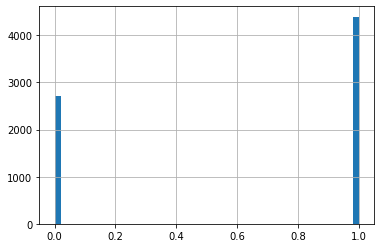

In [164]:
a['Modemajor1_happier'].hist(bins=50)

In [129]:
a.columns

Index(['Song', 'Artists', 'Popularity', 'Lengthofsong_s', 'danceability',
       'energy', 'loudness', 'Modemajor1_happier', 'acousticness', 'valence',
       'tempo', 'Fear', 'Trust', 'Joy', 'Disgust', 'Anticipation', 'Sadness',
       'Suprise', 'Negative', 'Positive'],
      dtype='object')

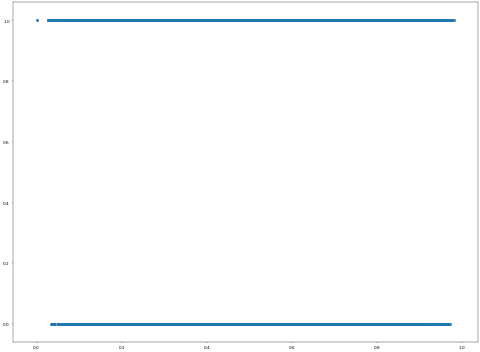

In [62]:
pyplot.figure(figsize=(20, 15), dpi=30)
pyplot.scatter(a['valence'],a['Modemajor1_happier'])

In [123]:
x

array([[ 2.52234279, -0.48931827, -0.40263805, ...,  0.82258322,
         0.13143678,  0.2984546 ],
       [ 2.66544171,  0.27079608,  0.22864821, ..., -0.18342452,
        -0.07925511, -0.26880535],
       [ 2.23614494, -0.22796652, -1.20964317, ..., -0.47569306,
         1.33442778, -0.84808883],
       ...,
       [ 0.23276   , -0.05348223, -1.71076731, ...,  2.39717048,
        -0.5278593 ,  2.4021886 ],
       [ 0.30430947, -0.04996603,  0.5605616 , ..., -0.25088748,
         1.862238  , -0.87484488],
       [-0.1249873 ,  1.21306119, -0.75407576, ...,  0.90862335,
         0.22317345,  0.38162429]])

In [148]:

pca = PCA(n_components=2)
# In [36]:
principalComponents = pca.fit_transform(x)
# In [37]:
principalDf = pd.DataFrame(data = principalComponents
           , columns = ['principal component 1', 'principal component 2'])
# In [38]:
principalDf

,principal component 1,principal component 2
0,1.432854,-0.976632
1,0.330375,0.353007
2,0.616288,2.857642
3,2.986889,-2.182597
4,0.187583,2.953309
...,...,...
7094,-0.966271,0.111652
7095,-0.594429,-0.040686
7096,2.881193,-3.744768
7097,1.236314,2.817419


In [161]:
a

,Song,Artists,Popularity,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,HIGHEST IN THE ROOM,Travis Scott,98,175.720,0.598,0.427,-8.764,0,0.055,0.060,76.469,0.040,0.050,0.040,0.010,0.035,0.025,0.025,0.045,0.050
1,Circles,Post Malone,100,215.280,0.695,0.762,-3.497,1,0.192,0.553,120.042,0.029,0.026,0.032,0.026,0.038,0.019,0.010,0.038,0.032
2,Bandit,Juice WRLD,94,189.322,0.474,0.631,-5.884,0,0.069,0.425,180.051,0.062,0.007,0.009,0.039,0.007,0.038,0.005,0.082,0.014
3,Lose You To Love Me,Selena Gomez,99,206.458,0.505,0.340,-9.005,1,0.576,0.092,101.993,0.036,0.003,0.137,0.031,0.003,0.045,0.020,0.048,0.146
4,hot girl bummer,blackbear,97,185.093,0.778,0.559,-7.109,0,0.128,0.678,129.989,0.033,0.002,0.008,0.047,0.000,0.043,0.000,0.086,0.016
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,YUSO,Kid Ink,64,173.640,0.900,0.649,-6.365,1,0.004,0.658,93.990,0.011,0.003,0.025,0.011,0.014,0.008,0.025,0.031,0.025
7096,Sick Feeling,boy pablo,66,155.714,0.425,0.504,-10.003,1,0.022,0.403,165.818,0.018,0.010,0.011,0.007,0.011,0.017,0.035,0.038,0.022
7097,For Now,Kina Grannis,66,198.403,0.397,0.249,-10.484,1,0.926,0.329,79.614,0.000,0.067,0.061,0.037,0.049,0.018,0.049,0.025,0.117
7098,Supuestamente,Ozuna,67,198.586,0.746,0.682,-4.426,1,0.235,0.805,173.901,0.060,0.013,0.013,0.026,0.026,0.056,0.009,0.099,0.013


In [60]:
a_=pd.DataFrame(data = x, columns = features)

NameError: name 'x' is not defined

In [163]:
a_

,Popularity,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,2.522343,-0.489318,-0.402638,-1.103701,-0.756488,-1.274139,-0.730041,-1.882707,-1.531662,0.731645,1.287209,0.559779,-0.370880,0.537759,0.078109,0.821998,0.131451,0.298577
1,2.665442,0.270796,0.228648,0.779841,1.158014,0.784844,-0.192121,0.372347,-0.080235,0.247566,0.184403,0.252896,0.507606,0.669662,-0.182850,-0.158439,-0.094139,-0.270247
2,2.236145,-0.227967,-1.209643,0.043292,0.290363,-1.274139,-0.675071,-0.213143,1.918679,1.699804,-0.688652,-0.629394,1.221376,-0.693340,0.643519,-0.485251,1.323855,-0.839072
3,2.593892,0.101288,-1.007892,-1.592859,-0.844090,0.784844,1.315627,-1.736335,-0.681452,0.555617,-0.872452,4.280738,0.782133,-0.869211,0.947970,0.495186,0.228132,3.332307
4,2.450793,-0.309223,0.768821,-0.361529,-0.154912,-1.274139,-0.443412,0.944116,0.251102,0.423595,-0.918403,-0.667754,1.660619,-1.001115,0.860984,-0.812064,1.452764,-0.775869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7094,0.089661,-0.529284,1.562810,0.144497,0.115525,0.784844,-0.930289,0.852633,-0.948033,-0.544564,-0.872452,-0.015627,-0.315975,-0.385565,-0.661274,0.821998,-0.319729,-0.491457
7095,0.232760,-0.873718,-1.528540,-0.670767,-1.206853,0.784844,-0.859613,-0.313775,1.444575,-0.236513,-0.550801,-0.552673,-0.535596,-0.517469,-0.269836,1.475623,-0.094139,-0.586261
7096,0.232760,-0.053482,-1.710767,-2.104508,-1.381692,0.784844,2.689876,-0.652262,-1.426901,-1.028643,2.068363,1.365347,1.111565,1.153308,-0.226343,2.390698,-0.513092,2.415868
7097,0.304309,-0.049966,0.560562,0.330040,0.820332,0.784844,-0.023284,1.525033,1.713821,1.611790,-0.412950,-0.475952,0.507606,0.142048,1.426394,-0.223801,1.871717,-0.870673


In [166]:
y=a_.loc[:,['Modemajor1_happier']].values

In [59]:
x=a_.drop(['Modemajor1_happier'],axis=1)

NameError: name 'a_' is not defined

In [119]:
#x=x.values
x



array([[9.80000000e+01, 1.75720000e+02, 5.98000000e-01, ...,
        2.50000000e-02, 4.50000000e-02, 5.00000000e-02],
       [1.00000000e+02, 2.15280000e+02, 6.95000000e-01, ...,
        9.61538462e-03, 3.84615385e-02, 3.20512821e-02],
       [9.40000000e+01, 1.89322000e+02, 4.74000000e-01, ...,
        5.14579760e-03, 8.23327616e-02, 1.37221269e-02],
       ...,
       [6.60000000e+01, 1.98403000e+02, 3.97000000e-01, ...,
        4.90797546e-02, 2.45398773e-02, 1.16564417e-01],
       [6.70000000e+01, 1.98586000e+02, 7.46000000e-01, ...,
        8.58369099e-03, 9.87124464e-02, 1.28755365e-02],
       [6.10000000e+01, 2.64320000e+02, 5.44000000e-01, ...,
        2.63157895e-02, 4.78468900e-02, 5.26315789e-02]])

In [50]:
a

,Artists,Popularity,Lengthofsong_s,danceability,energy,loudness,Modemajor1_happier,acousticness,valence,tempo,Fear,Trust,Joy,Disgust,Anticipation,Sadness,Suprise,Negative,Positive
0,Travis Scott,98,175.720,0.598,0.427,-8.764,0,0.055,0.060,76.469,0.040000,0.050000,0.040000,0.010000,0.035000,0.025000,0.025000,0.045000,0.050000
1,Post Malone,100,215.280,0.695,0.762,-3.497,1,0.192,0.553,120.042,0.028846,0.025641,0.032051,0.025641,0.038462,0.019231,0.009615,0.038462,0.032051
2,Juice WRLD,94,189.322,0.474,0.631,-5.884,0,0.069,0.425,180.051,0.061750,0.006861,0.008576,0.039451,0.006861,0.037736,0.005146,0.082333,0.013722
3,Selena Gomez,99,206.458,0.505,0.340,-9.005,1,0.576,0.092,101.993,0.036415,0.002801,0.137255,0.030812,0.002801,0.044818,0.019608,0.047619,0.145658
4,blackbear,97,185.093,0.778,0.559,-7.109,0,0.128,0.678,129.989,0.033333,0.001961,0.007843,0.047059,0.000000,0.043137,0.000000,0.086275,0.015686
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7095,Kid Ink,64,173.640,0.900,0.649,-6.365,1,0.004,0.658,93.990,0.011142,0.002786,0.025070,0.011142,0.013928,0.008357,0.025070,0.030641,0.025070
7096,boy pablo,66,155.714,0.425,0.504,-10.003,1,0.022,0.403,165.818,0.018131,0.009763,0.011158,0.006974,0.011158,0.016736,0.034868,0.037657,0.022315
7097,Kina Grannis,66,198.403,0.397,0.249,-10.484,1,0.926,0.329,79.614,0.000000,0.067485,0.061350,0.036810,0.049080,0.018405,0.049080,0.024540,0.116564
7098,Ozuna,67,198.586,0.746,0.682,-4.426,1,0.235,0.805,173.901,0.060086,0.012876,0.012876,0.025751,0.025751,0.055794,0.008584,0.098712,0.012876


In [149]:
final= pd.concat([principalDf,a[['Modemajor1_happier']]],axis=1)
final['Modemajor1_happier']=final['Modemajor1_happier'].apply(lambda x: 'Happy' if x==1 else 'Sad')
final.head()

,principal component 1,principal component 2,Modemajor1_happier
0,1.432854,-0.976632,Sad
1,0.330375,0.353007,Happy
2,0.616288,2.857642,Sad
3,2.986889,-2.182597,Happy
4,0.187583,2.953309,Sad


In [116]:
# final['Modemajor1_happier']=final['Modemajor1_happier'].apply(lambda x: 'Happy' if x==1 else 'Sad')

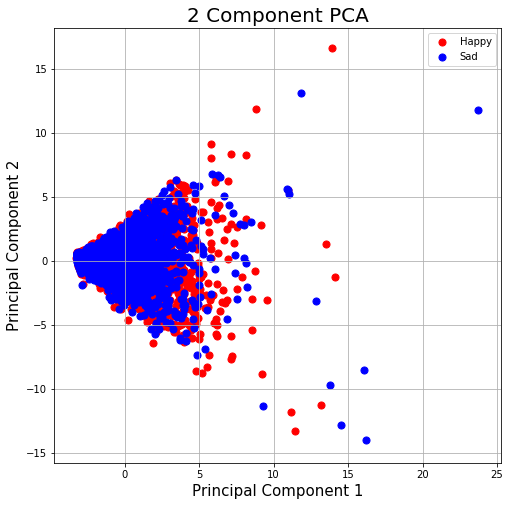

In [150]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 Component PCA', fontsize = 20)


targets = ['Happy', 'Sad']
colors = ['r', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = final['Modemajor1_happier'] == target
    ax.scatter(final.loc[indicesToKeep, 'principal component 1']
               , final.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

In [151]:
pca.explained_variance_ratio_

array([0.21296595, 0.14600715])

In [131]:
x.shape

(7099, 17)

/Users/ishagupta/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


ValueError: Filler values must be provided when X has more than 2 training features.

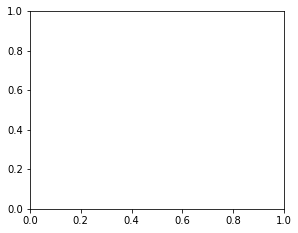

In [166]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from mlxtend.classifier import EnsembleVoteClassifier
from mlxtend.data import iris_data
from mlxtend.plotting import plot_decision_regions

# Initializing Classifiers
clf1 = LogisticRegression(random_state=0)
clf2 = RandomForestClassifier(random_state=0)
clf3 = SVC(random_state=0, probability=True)
eclf = EnsembleVoteClassifier(clfs=[clf1, clf2],
                              weights=[2, 1], voting='soft')

# Loading some example data
# X, y = iris_data()
# X = X[:,[0, 2]]
x
# Plotting Decision Regions

gs = gridspec.GridSpec(2, 2)
fig = plt.figure(figsize=(10, 8))

labels = ['Logistic Regression',
          'Random Forest',
          'RBF kernel SVM',
          'Ensemble']

for clf, lab, grd in zip([clf1, clf2, eclf],
                         labels,
                         itertools.product([0, 1],
                         repeat=2)):
    clf.fit(x, y)
    ax = plt.subplot(gs[grd[0], grd[1]])
    fig = plot_decision_regions(X=x, y=y,
                                clf=clf, legend=2)
    plt.title(lab)

plt.show()

In [156]:
a,b = iris_data()
a = a[:,[0, 2]]

In [155]:
y

array([[0],
       [1],
       [0],
       ...,
       [1],
       [1],
       [1]])

In [157]:
b

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])